In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
import cv2
import matplotlib.pyplot as plt
import PIL.Image as Image

In [2]:
DATA_DIR = './data/eyes/'
x_train_dir = os.path.join(DATA_DIR, 'train')
y_train_dir = os.path.join(DATA_DIR, 'trainannot')

x_valid_dir = os.path.join(DATA_DIR, 'val')
y_valid_dir = os.path.join(DATA_DIR, 'valannot')

x_test_dir = os.path.join(DATA_DIR, 'test')
y_test_dir = os.path.join(DATA_DIR, 'testannot')

In [3]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

In [4]:
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

In [5]:
class Dataset(BaseDataset):
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]
        
        # convert str names to class values on masks
        #self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        self.class_values = [255]
        #print(self.class_values)
        
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        if self.augmentation!=None:
            i=i%len(self.ids)
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        #扩充边界 把565*584的图片变为576*584的图片
        image=cv2.copyMakeBorder(image, 0,0,5,6,cv2.BORDER_CONSTANT,value=[0,0,0]) 
        #上下裁掉4个像素
        image = image[4:580, :, :]
        # #转为灰度图
        # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # #第三维为1
        # image = np.expand_dims(image, axis=2)
        
        mask = cv2.imread(self.masks_fps[i], 0)
        #扩充边界 把565*584的图片变为576*584的图片
        mask=cv2.copyMakeBorder(mask, 0,0,5,6,cv2.BORDER_CONSTANT,value=[0])
        #上下裁掉4个像素
        mask = mask[4:580, :, ]
        # extract certain classes from mask (e.g. cars)
        masks = [(mask == v) for v in self.class_values]
        # print(masks)
        mask = np.stack(masks, axis=-1).astype('float')


        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            #把(3, 608, 576)大小的图片取出第二通道，变为(1，608, 576)大小
            #image = np.expand_dims(image[1], axis=0)
                
        
        return image, mask
        
    def __len__(self):
        if self.augmentation!=None:
            return 4*len(self.ids)
        return len(self.ids)

### Augmentations

In [9]:
import albumentations as albu
def get_training_augmentation():
    train_transform = [
        albu.HorizontalFlip(p=0.5),
        # albu.PadIfNeeded(min_height=576, min_width=576, always_apply=True, border_mode=0,value=0),
        # albu.RandomCrop(height=576, width=576, always_apply=True),
        albu.ShiftScaleRotate(
            scale_limit=0.3,
            rotate_limit=(-45, 45),
            shift_limit=0.3,
            p=1,
            border_mode=0,
        ),
        albu.GaussNoise(p=0.2),
        albu.Perspective(p=0.5),
        albu.OneOf(
            [
                albu.CLAHE(p=0.5),
                albu.RandomBrightnessContrast(p=0.5),
                albu.RandomGamma(p=0.5),
            ],
            p=0.5,
        ),
        albu.OneOf(
            [
                albu.Sharpen(p=0.5),
                albu.Blur(blur_limit=3, p=0.5),
                albu.MotionBlur(blur_limit=3, p=0.5),
            ],
            p=0.5,
        ),
        albu.OneOf(
            [
                albu.RandomBrightnessContrast(p=0.5),
                albu.HueSaturationValue(p=0.5),
            ],
            p=0.5,
        ),
    ]
    return albu.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        #albu.PadIfNeeded(608, 576)
        #albu.Resize(608, 576),
    ]
    return albu.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(mean, std):    
    _transform = [
        #根据mean和std对数据进行标准化
        albu.Normalize(mean=mean, std=std),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

80
(576, 576, 3)
(576, 576, 1)


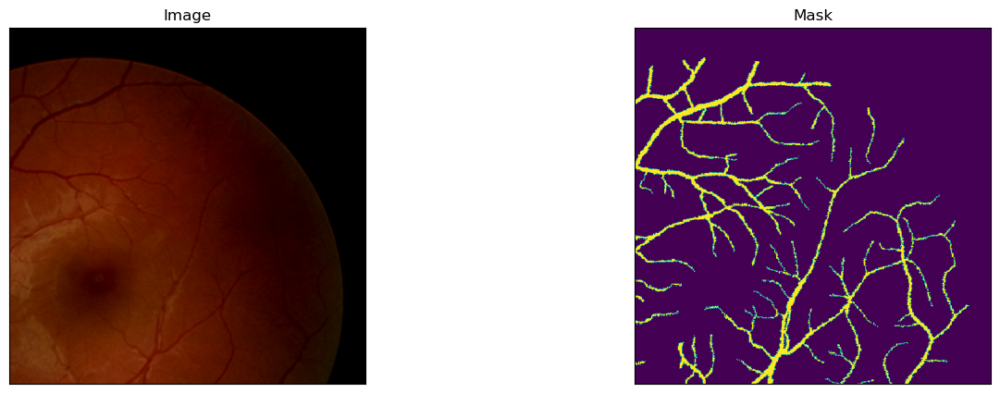

(576, 576, 3)
(576, 576, 1)


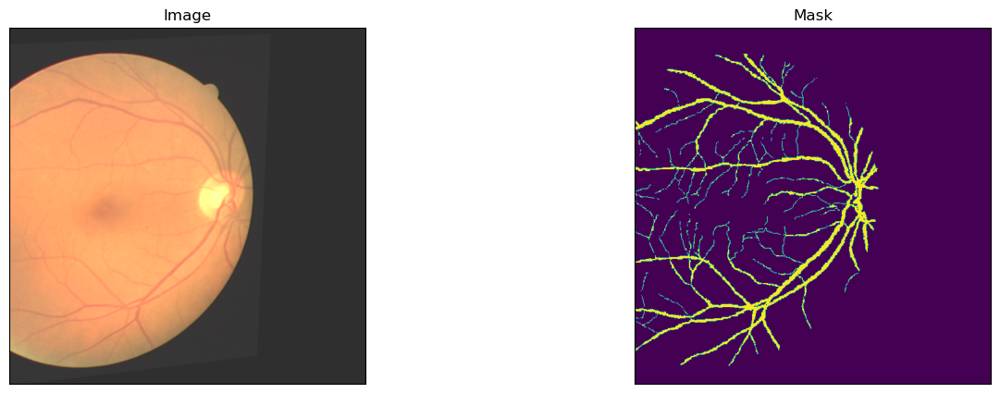

In [24]:
#### Visualize resulted augmented images and masks
augmented_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    augmentation=get_training_augmentation(), 
)
print(len(augmented_dataset))
# same image with different random transforms
for i in range(2):
    image, mask = augmented_dataset[i]
    print(image.shape)
    print(mask.shape)
    visualize(image=image, mask=mask)

标准化

Compute mean and variance for training data.
20
标准化前 [0.49449528 0.26900229 0.16137745] [0.3330333  0.17922099 0.0994361 ]
Compute mean and variance for training data.
20
Compute mean and variance for training data.
20


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


标准化后 [1.95732875e-08 1.95732875e-08 1.95732875e-08] [1.01244279 1.01244279 1.01244279]


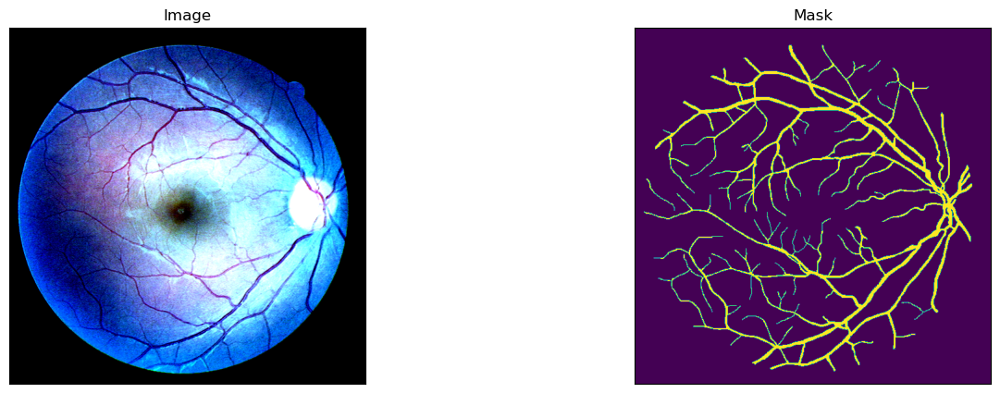

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


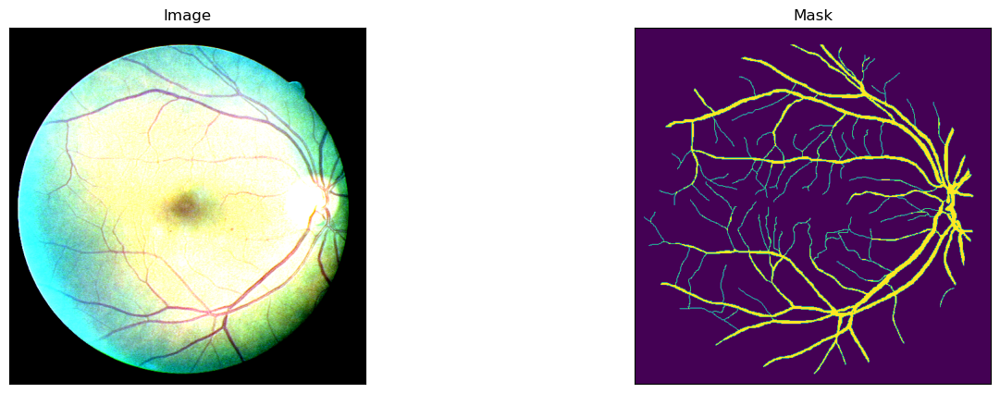

In [8]:
# Lets look at data we have

dataset = Dataset(x_train_dir, y_train_dir)

#计算std和mean
import torch
def getStat(train_data):
    print("Compute mean and variance for training data.")
    print(len(train_data))
    
    all_mean = np.zeros(3)
    all_std = np.zeros(3)
    for image,mask in train_data:
        #利用cv2计算每个通道的均值和方差
        mean,std=cv2.meanStdDev(image)
        #加入总的均值和方差中
        all_mean += mean.squeeze()
        all_std += std.squeeze()
    all_mean/=(len(train_data)*255)
    all_std/=(len(train_data)*255)
    return all_mean, all_std

mean,std=getStat(dataset)

print("标准化前",mean,std)

dataset = Dataset(x_train_dir, y_train_dir, 
                preprocessing=get_preprocessing(mean,std))
print("标准化后",getStat(dataset)[0]*255,getStat(dataset)[1]*255)

#查看标准化后的图片
for i in range(2):
    image, mask = dataset[i]
    #逆to_tensor
    image = image.transpose(1, 2, 0)
    mask = mask.transpose(1, 2, 0)
    visualize(image=image, mask=mask)

## Create model and train

In [9]:
import numpy as np
import segmentation_models_pytorch as smp

d:\Anaconda3\envs\torch\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
#preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS,)
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    augmentation=get_training_augmentation(), 
    preprocessing=get_preprocessing(mean,std),
)

valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    #augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(mean,std),
)

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True, num_workers=0)

valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=0)

C:\Users\Administrator\AppData\Roaming\Python\Python39\site-packages\albumentations\augmentations\transforms.py:1149: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


In [11]:
#查看train_loader的数据
for i, (data, target) in enumerate(train_loader):
    print(data.shape)
    print(target.shape)
    break

torch.Size([1, 3, 576, 576])
torch.Size([1, 1, 576, 576])


In [12]:
ENCODER = 'tu-efficientnetv2_rw_t'
#ENCODER = 'timm-regnetx_002'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['eye']
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation
DEVICE = 'cuda'
IN_CHANNELS=3,
# create segmentation model with pretrained encoder
model = smp.UnetPlusPlus(
    encoder_name=ENCODER, 
    encoder_weights=None, 
    in_channels=IN_CHANNELS[0],
    classes=1, 
    activation=ACTIVATION,
)
try:
    model=torch.load(f'models/best_{model.name}_{IN_CHANNELS[0]}.pth')
    print(f"导入本地模型models/best_{model.name}_{IN_CHANNELS[0]}成功")
except:
    print("导入本地模型失败")

导入本地模型models/best_unetplusplus-tu-efficientnetv2_rw_t_3成功


In [13]:
from segmentation_models_pytorch import utils

loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.AdamW([ 
    dict(params=model.parameters(), lr=0.001),
])

In [14]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [15]:
# train model for 40 epochs
#定义学习率调整策略
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.5, patience=3,verbose=True)
min_loss = 100
best_epoch = 0

for epoch in range(0, 5000):
    
    print('\nEpoch: {}'.format(epoch))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    
    # do something (save model, change lr, etc.)
    if min_loss > valid_logs['dice_loss']:
        min_loss = valid_logs['dice_loss']
        best_epoch = epoch
        torch.save(model, f'models/best_{model.name}_{IN_CHANNELS[0]}.pth')
        print('Model saved!')

    if epoch-best_epoch==20:
        print('Early stopping!')
        break
        
    lr_scheduler.step(valid_logs['dice_loss'])


Epoch: 0
valid: 100%|██████████| 20/20 [00:02<00:00,  9.38it/s, dice_loss - 0.2539, iou_score - 0.5995]
Model saved!

Epoch: 1
valid: 100%|██████████| 20/20 [00:02<00:00,  8.70it/s, dice_loss - 0.2599, iou_score - 0.5919]

Epoch: 2
valid: 100%|██████████| 20/20 [00:01<00:00, 10.21it/s, dice_loss - 0.2356, iou_score - 0.6234]
Model saved!

Epoch: 3
valid: 100%|██████████| 20/20 [00:01<00:00, 11.00it/s, dice_loss - 0.3035, iou_score - 0.5402]

Epoch: 4
valid: 100%|██████████| 20/20 [00:01<00:00, 11.69it/s, dice_loss - 0.2331, iou_score - 0.6254]
Model saved!

Epoch: 5
valid: 100%|██████████| 20/20 [00:02<00:00,  8.82it/s, dice_loss - 0.2384, iou_score - 0.6187]

Epoch: 6
valid: 100%|██████████| 20/20 [00:01<00:00, 11.19it/s, dice_loss - 0.2573, iou_score - 0.5965]

Epoch: 7
valid: 100%|██████████| 20/20 [00:02<00:00,  9.83it/s, dice_loss - 0.258, iou_score - 0.5935] 

Epoch: 8
valid: 100%|██████████| 20/20 [00:02<00:00,  8.99it/s, dice_loss - 0.2284, iou_score - 0.6316]
Model saved!

Ep

KeyboardInterrupt: 

## Test best saved model

In [ ]:
# load best saved checkpoint
best_model = torch.load(f'models/best_{model.name}_{IN_CHANNELS[0]}.pth')

In [ ]:
# create test dataset
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    #augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(mean,std),
)

test_dataloader = DataLoader(test_dataset)

In [ ]:
# evaluate model on test set
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

valid: 100%|██████████| 20/20 [00:06<00:00,  3.18it/s, dice_loss - 0.242, iou_score - 0.6149] 


## Visualize predictions

In [ ]:
# load best saved checkpoint
best_model = torch.load(f'models/best_{model.name}_{IN_CHANNELS[0]}.pth')
# test dataset without transformations for image visualization
test_dataset = Dataset(
    x_test_dir, y_test_dir, 
    augmentation=None,
    preprocessing=get_preprocessing(mean,std),
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


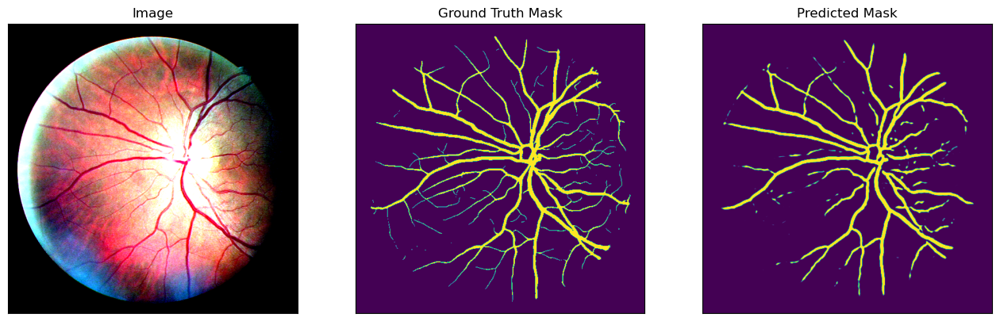

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


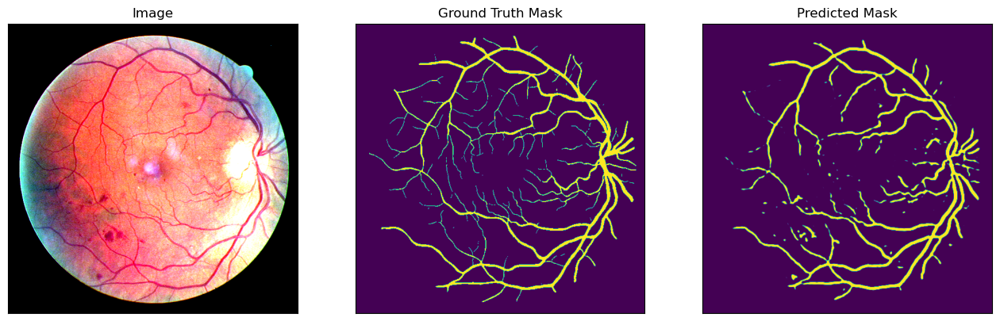

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


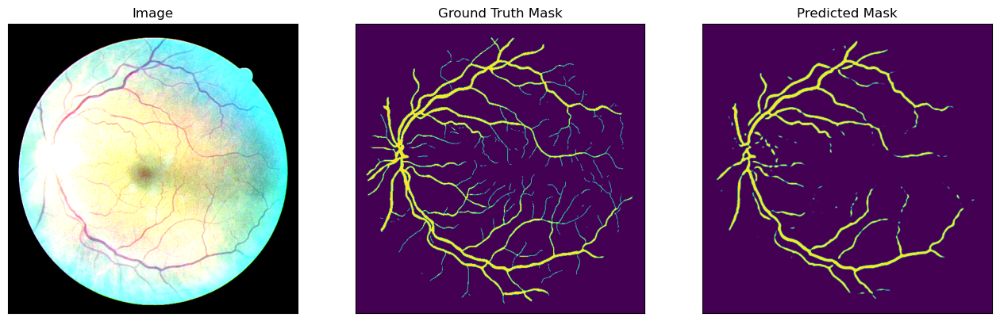

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


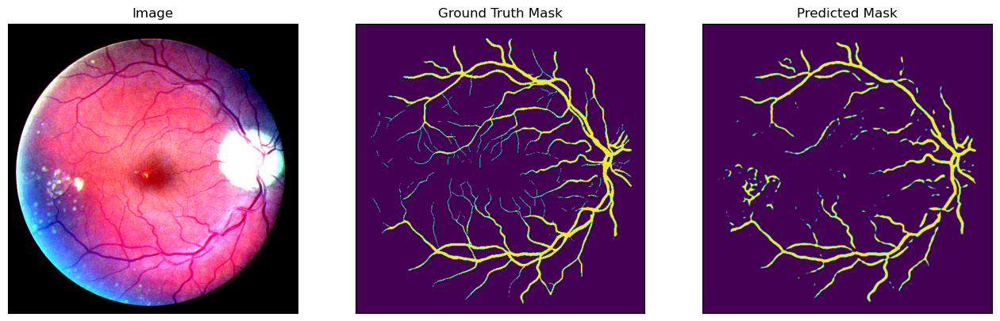

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


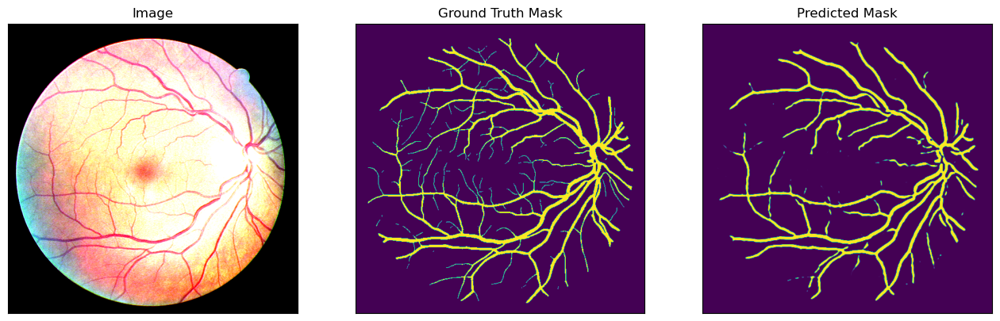

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


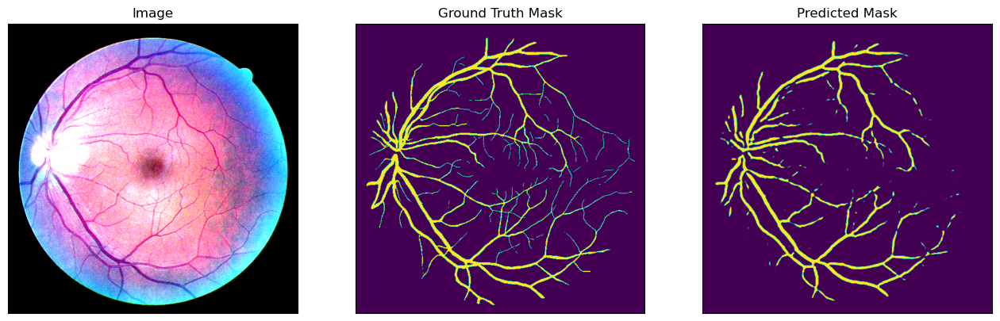

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


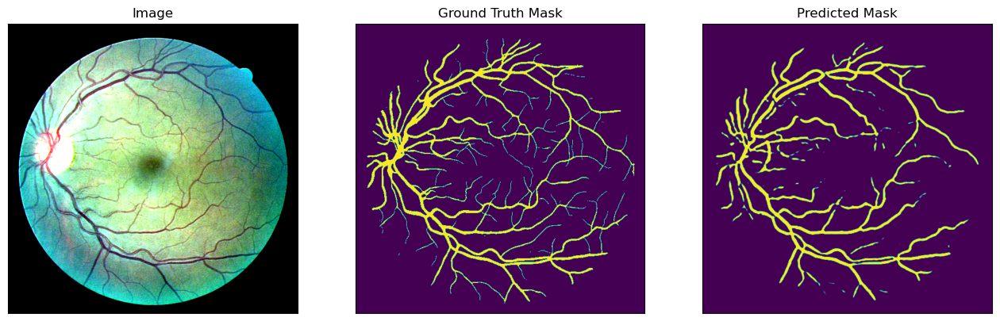

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


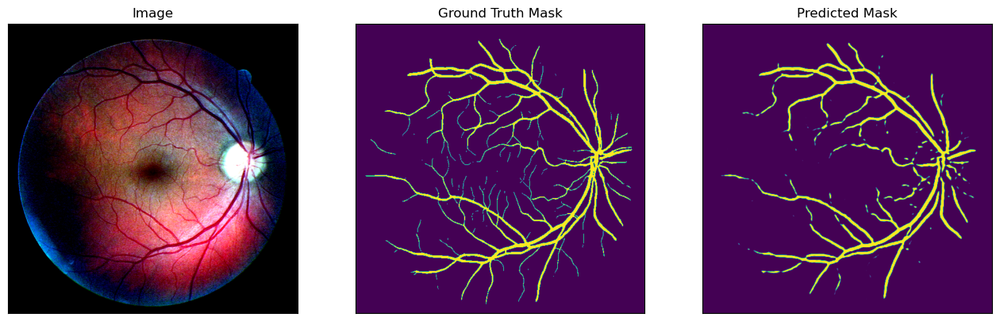

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


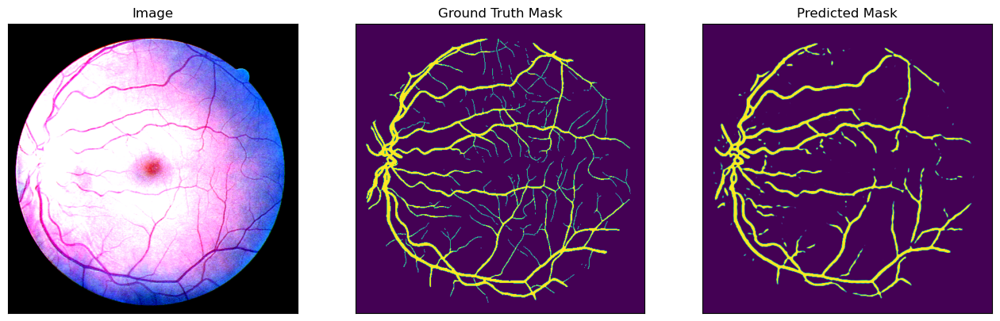

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


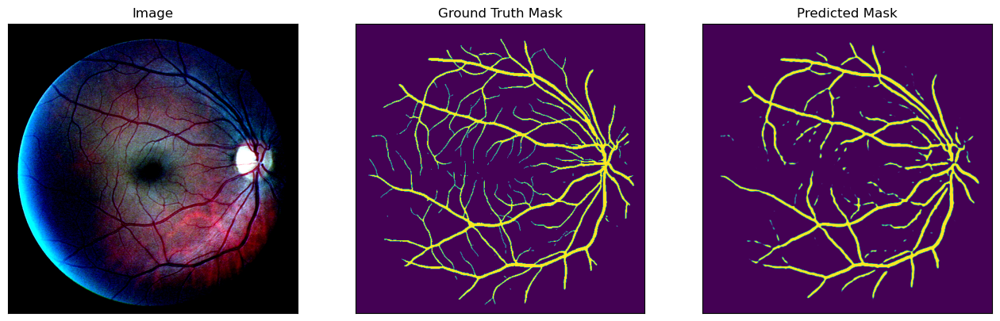

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


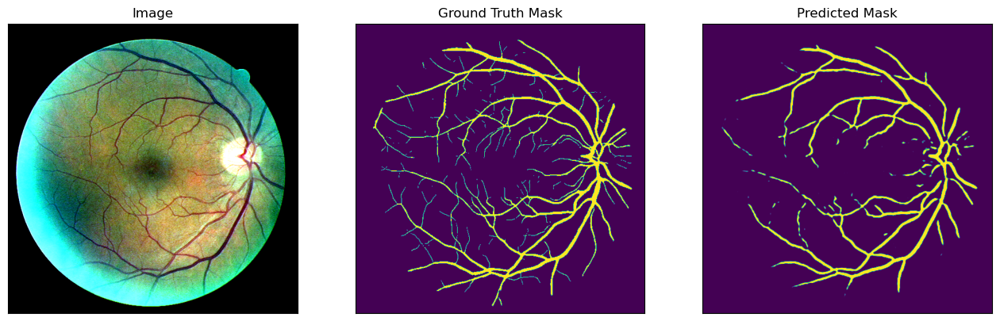

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


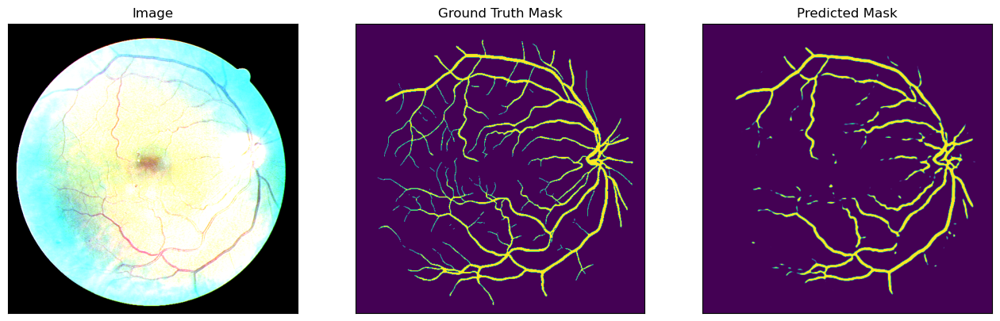

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


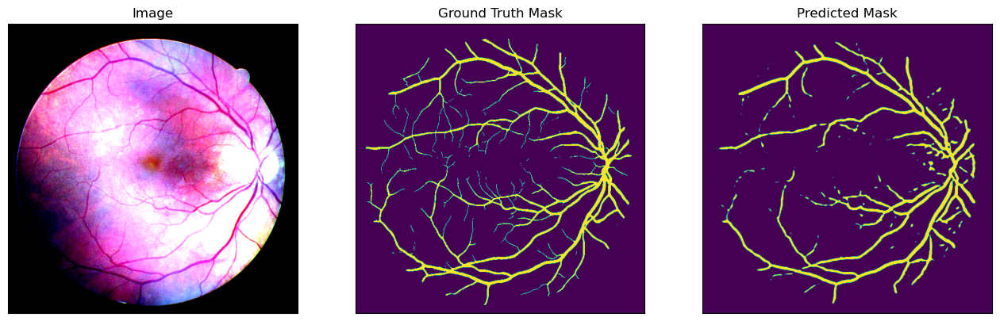

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


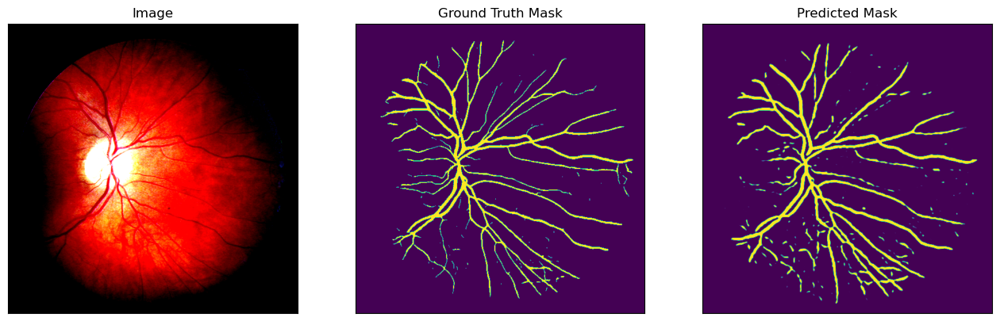

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


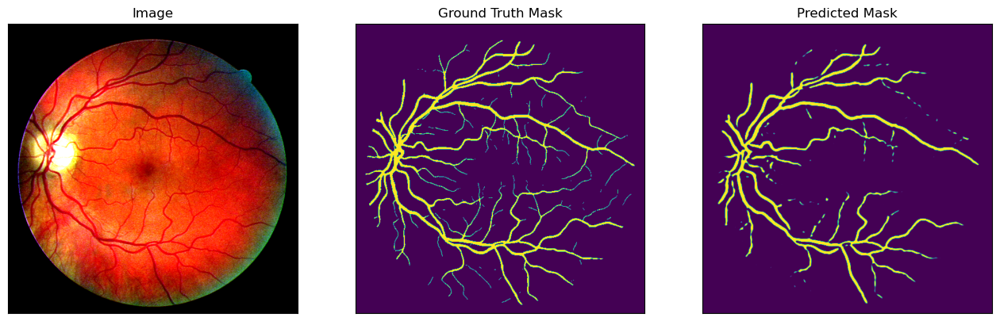

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


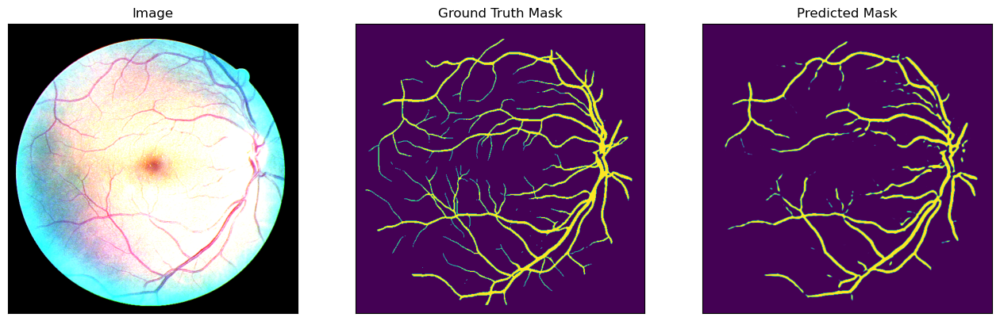

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


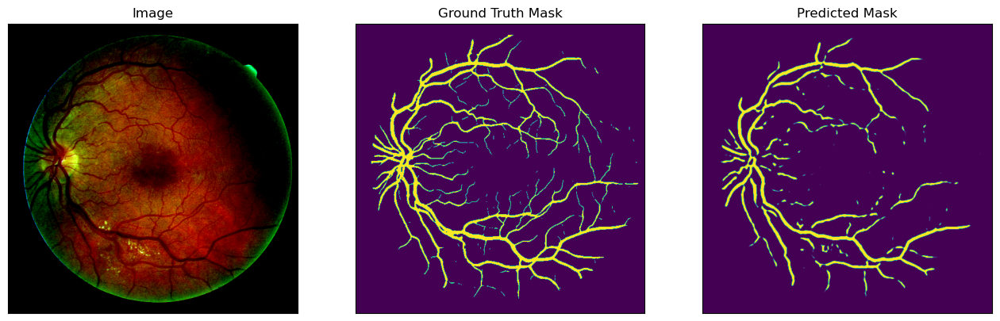

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


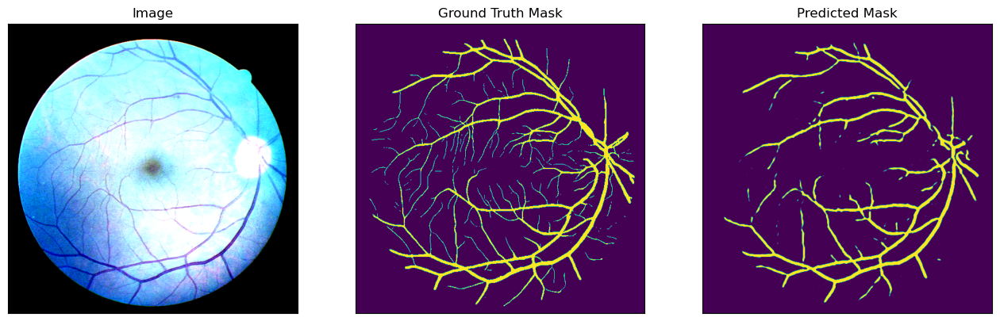

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


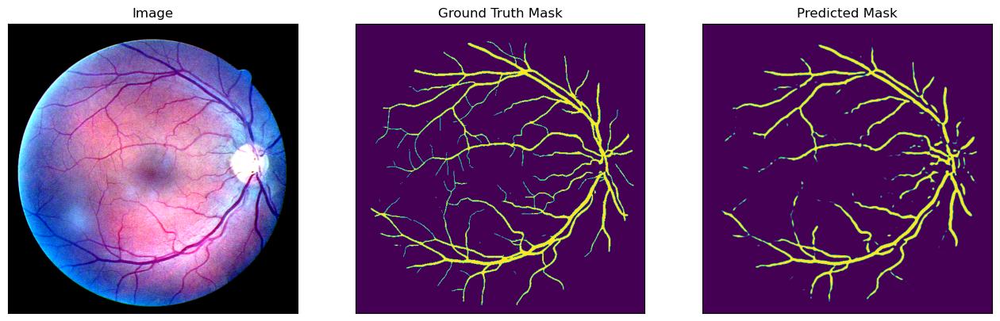

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


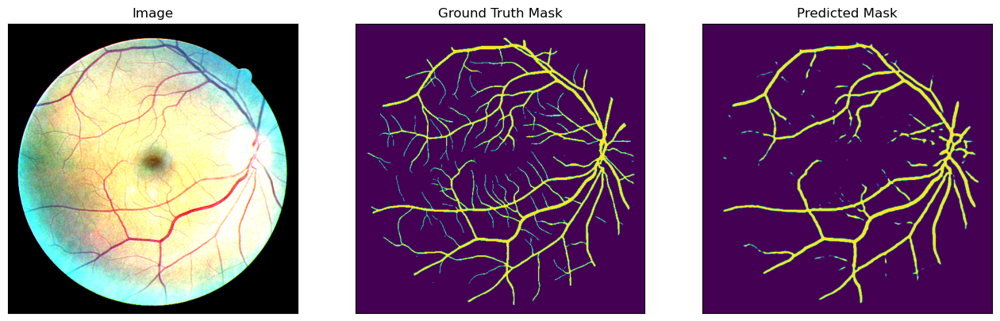

In [ ]:
import torchvision
num = len(test_dataset)
image_list=[]
name_list=[]
for n in range(num):
    image, gt_mask = test_dataset[n]
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    gt_mask = ((gt_mask*255).round())

    pr_mask = best_model.predict(x_tensor).squeeze(0).cpu().numpy()
    
    #逆to_tensor
    image = image.transpose(1, 2, 0)
    gt_mask = gt_mask.transpose(1, 2, 0)
    pr_mask = pr_mask.transpose(1, 2, 0)
    
    visualize(
        image=image, 
        ground_truth_mask=gt_mask, 
        predicted_mask=pr_mask
    )

    #pr_mask上下扩充4个像素
    pr_mask=cv2.copyMakeBorder(pr_mask, 4,4,0,0,cv2.BORDER_CONSTANT,value=[0])
    #pr_mask左边裁掉5个像素，右边裁掉6个像素
    pr_mask = pr_mask[:, 5:570]
    #pr_mask = pr_mask[1]
    img_save_path = os.path.join('data/eyes/predict', f"{n+1}.png")
    cv2.imwrite(img_save_path, pr_mask)
    image_list.append(pr_mask)
    name_list.append(f"{n+1}.png")


In [ ]:
import pandas as pd
from PIL import Image
def turn_to_str(image_list):
    outputs = []
    for image in image_list:
        transform = torchvision.transforms.ToTensor()
        image=Image.fromarray(image).convert('L')
        image = image.resize((512, 512), Image.Resampling.BILINEAR)
        image = transform(image)
        image[image > 0] = 1
        dots = np.where(image.flatten() == 1)[0]
        run_lengths = []
        prev = -2
        for b in dots:
            if (b > prev + 1):
                run_lengths.extend((b + 1, 0))
            run_lengths[-1] += 1
            prev = b
        output = ' '.join([str(r) for r in run_lengths])
        outputs.append(output)
    return outputs

def save_to_csv(name_list, str_list):
    df = pd.DataFrame(columns=['Id', 'Predicted'])
    df['Id'] = [i.split('.')[0] for i in name_list]
    df['Predicted'] = str_list
    df.to_csv(f'results/best_{model.name}_{IN_CHANNELS[0]}.csv', index=None)

str_list = turn_to_str(image_list)
save_to_csv(name_list, str_list)

In [87]:
import PIL.Image as Image
import numpy as np
import cv2
gt_mask=Image.open("test/image/20.jpg")
pr_mask=Image.open("results/manet-tu-efficientnetv2_rw_t/20.jpg").convert('L')
#pr有数值部分变为绿色
pr_mask=np.array(pr_mask)
#pr_mask=pr_mask/255
#pr_mask大于0的变为255
pr_mask[pr_mask>0.5*255]=255
pr_mask[pr_mask!=255]=0
#对pr_mask中的数值进行sigmoid
# pr_mask=1/(1+np.exp(-pr_mask))
# #大于0.5的变为255，小于0.5的变为0
# pr_mask[pr_mask>=0.5]=255
# pr_mask[pr_mask<0.5]=0
# #统计pr_mask中各个像素值的个数
# unique, counts = np.unique(pr_mask, return_counts=True)
# print(dict(zip(unique, counts)))
#pr_mask[pr_mask]=200
#转为三通道
pr_mask=np.stack((pr_mask*0,pr_mask,pr_mask*0),axis=2)
pr_mask=Image.fromarray(pr_mask)
#叠加两张图，pr_mask为上层图
gt_mask=Image.blend(gt_mask,pr_mask,0.3)
gt_mask.show()

In [ ]:
#可视化分割结果
#原图
image=Image.open("test/image/20.jpg")
#真值
pr_mask=Image.open("results/unetplusplus-tu-efficientnetv2_rw_t/20.jpg")
#叠加两张图，pr_mask有值的地方为绿色
pr_mask=np.array(pr_mask)
pr_mask[pr_mask[:,:,0]==255]=[0,255,0]
pr_mask=Image.fromarray(pr_mask)
#叠加两张图，pr_mask为上层图
image=Image.blend(image,pr_mask,1)
image.show()